
## Overview

This notebook will show you how to create and query a table or DataFrame that you uploaded to DBFS. [DBFS](https://docs.databricks.com/user-guide/dbfs-databricks-file-system.html) is a Databricks File System that allows you to store data for querying inside of Databricks. This notebook assumes that you have a file already inside of DBFS that you would like to read from.

This notebook is written in **Python** so the default cell type is Python. However, you can use different languages by using the `%LANGUAGE` syntax. Python, Scala, SQL, and R are all supported.

In [0]:
# File location and type
file_location = "/FileStore/tables/sandhyaavineni_Bigdata/usa_rain_prediction_dataset_new.csv"
file_type = "csv"

# CSV options
infer_schema = "false"
first_row_is_header = "false"
delimiter = ","

# The applied options are for CSV files. For other file types, these will be ignored.
df = spark.read.format(file_type) \
  .option("inferSchema", infer_schema) \
  .option("header", first_row_is_header) \
  .option("sep", delimiter) \
  .load(file_location)

display(df)

_c0,_c1,_c2,_c3,_c4,_c5,_c6,_c7,_c8
Date,Location,Temperature,Humidity,Wind Speed,Precipitation,Cloud Cover,Pressure,Rain Tomorrow
2024-01-01,New York,87.52479515009425,75.65545502580588,28.37950587380741,0.0,69.61796584045324,1026.0302783896793,0
2024-01-02,New York,83.25932474899207,28.71261746459095,12.436432748807855,0.5269951963955639,41.60604839157813,995.9620654920454,0
2024-01-03,New York,80.94304971837803,64.74004334751167,14.184830644531027,0.9168844467446982,77.36476252212917,980.7967386461795,1
2024-01-04,New York,78.09755204536036,59.73898405178837,19.444028576076082,0.0941344055614183,52.54119577009328,979.0121628423897,0
2024-01-05,New York,37.05996274231768,34.76678392388895,3.689660638639134,1.3612724897080222,85.58399951609859,1031.7908589962067,0
2024-01-06,New York,35.29864835260338,56.5980988940744,21.442424123034442,0.5826612255460767,22.82510327446117,1036.0433969925803,0
2024-01-07,New York,50.380818111166946,95.42419325252563,8.753319079168689,0.0,36.82095828615068,1032.337889259911,0
2024-01-08,New York,79.96700708414504,28.186103774175493,27.495321651539168,0.10584492483047321,77.80745897524827,1039.8976516115138,0
2024-01-09,New York,36.56548851260809,72.09962124129873,19.8856350336327,0.9103678483603654,34.3336985567252,975.4466013040396,1


In [0]:
# Create a view or table

temp_table_name = "usa_rain_prediction_dataset_new_csv"

df.createOrReplaceTempView(temp_table_name)

In [0]:
%sql

/* Query the created temp table in a SQL cell */

select * from `usa_rain_prediction_dataset_new_csv`

_c0,_c1,_c2,_c3,_c4,_c5,_c6,_c7,_c8
Date,Location,Temperature,Humidity,Wind Speed,Precipitation,Cloud Cover,Pressure,Rain Tomorrow
2024-01-01,New York,87.52479515009425,75.65545502580588,28.37950587380741,0.0,69.61796584045324,1026.0302783896793,0
2024-01-02,New York,83.25932474899207,28.71261746459095,12.436432748807855,0.5269951963955639,41.60604839157813,995.9620654920454,0
2024-01-03,New York,80.94304971837803,64.74004334751167,14.184830644531027,0.9168844467446982,77.36476252212917,980.7967386461795,1
2024-01-04,New York,78.09755204536036,59.73898405178837,19.444028576076082,0.0941344055614183,52.54119577009328,979.0121628423897,0
2024-01-05,New York,37.05996274231768,34.76678392388895,3.689660638639134,1.3612724897080222,85.58399951609859,1031.7908589962067,0
2024-01-06,New York,35.29864835260338,56.5980988940744,21.442424123034442,0.5826612255460767,22.82510327446117,1036.0433969925803,0
2024-01-07,New York,50.380818111166946,95.42419325252563,8.753319079168689,0.0,36.82095828615068,1032.337889259911,0
2024-01-08,New York,79.96700708414504,28.186103774175493,27.495321651539168,0.10584492483047321,77.80745897524827,1039.8976516115138,0
2024-01-09,New York,36.56548851260809,72.09962124129873,19.8856350336327,0.9103678483603654,34.3336985567252,975.4466013040396,1


In [0]:
# With this registered as a temp view, it will only be available to this particular notebook. If you'd like other users to be able to query this table, you can also create a table from the DataFrame.
# Once saved, this table will persist across cluster restarts as well as allow various users across different notebooks to query this data.
# To do so, choose your table name and uncomment the bottom line.

permanent_table_name = "usa_rain_prediction_dataset_new_csv"

# df.write.format("parquet").saveAsTable(permanent_table_name)

In [0]:
!pip3 install numpy pandas matplotlib opendatasets scikit--learn

  Using cached opendatasets-0.1.22-py3-none-any.whl (15 kB)
  Using cached kaggle-1.6.17-py3-none-any.whl
  Using cached numpy-1.24.4-cp310-cp310-manylinux_2_17_x86_64.manylinux2014_x86_64.whl (17.3 MB)
  Using cached python_slugify-8.0.4-py2.py3-none-any.whl (10 kB)
  Using cached certifi-2025.1.31-py3-none-any.whl (166 kB)
  Using cached text_unidecode-1.3-py2.py3-none-any.whl (78 kB)
  Attempting uninstall: numpy
    Found existing installation: numpy 1.26.4
    Not uninstalling numpy at /local_disk0/.ephemeral_nfs/cluster_libraries/python/lib/python3.10/site-packages, outside environment /local_disk0/.ephemeral_nfs/envs/pythonEnv-809018f2-9087-4650-aadb-77068f3a7a5c
    Can't uninstall 'numpy'. No files were found to uninstall.
  Attempting uninstall: certifi
    Found existing installation: certifi 2022.9.14
    Not uninstalling certifi at /databricks/python3/lib/python3.10/site-packages, outside environment /local_disk0/.ephemeral_nfs/envs/pythonEnv-809018f2-9087-4650-aadb-77068f

In [0]:
raw_df = spark.read.csv("/FileStore/tables/sandhyaavineni_Bigdata/usa_rain_prediction_dataset_new.csv", header=True, inferSchema=True)
display(raw_df)

Date,Location,Temperature,Humidity,Wind Speed,Precipitation,Cloud Cover,Pressure,Rain Tomorrow
2024-01-01,New York,87.52479515009425,75.65545502580588,28.37950587380741,0.0,69.61796584045324,1026.0302783896793,0
2024-01-02,New York,83.25932474899207,28.71261746459095,12.436432748807855,0.5269951963955639,41.60604839157813,995.9620654920454,0
2024-01-03,New York,80.94304971837803,64.74004334751167,14.184830644531027,0.9168844467446982,77.36476252212917,980.7967386461795,1
2024-01-04,New York,78.09755204536036,59.73898405178837,19.444028576076082,0.0941344055614183,52.54119577009328,979.0121628423897,0
2024-01-05,New York,37.05996274231768,34.76678392388895,3.689660638639134,1.3612724897080222,85.58399951609859,1031.7908589962067,0
2024-01-06,New York,35.29864835260338,56.5980988940744,21.442424123034442,0.5826612255460767,22.82510327446117,1036.0433969925803,0
2024-01-07,New York,50.380818111166946,95.42419325252563,8.753319079168689,0.0,36.82095828615068,1032.337889259911,0
2024-01-08,New York,79.96700708414504,28.186103774175493,27.495321651539168,0.10584492483047321,77.80745897524827,1039.8976516115138,0
2024-01-09,New York,36.56548851260809,72.09962124129873,19.8856350336327,0.9103678483603654,34.3336985567252,975.4466013040396,1
2024-01-10,New York,69.600506199126,30.248212520167108,0.3254150678530421,0.0,46.82556632826914,1039.132281133973,0


In [0]:
raw_df

DataFrame[Date: date, Location: string, Temperature: double, Humidity: double, Wind Speed: double, Precipitation: double, Cloud Cover: double, Pressure: double, Rain Tomorrow: int]

In [0]:
import plotly.express as px

In [0]:
import plotly.express as px

# Convert Spark DataFrame to Pandas DataFrame
raw_df_pandas = raw_df.toPandas()

# Create scatter plot
fig = px.scatter(
    raw_df_pandas,
    x='Humidity',
    y='Temperature',
    color='Rain Tomorrow',
    opacity=0.5
)
fig.show()

In [0]:
# Ensure raw_df is a valid DataFrame
raw_df = raw_df.toPandas()

# Create the histogram
fig = px.histogram(
    raw_df,
    x='Location',
    y='Humidity',
    color='Rain Tomorrow'
)
fig.show()

In [0]:
round(raw_df.describe().T,2)

,count,mean,std,min,25%,50%,75%,max
Temperature,73100.0,65.18,20.21,30.0,47.68,65.29,82.64,100.00
Humidity,73100.0,59.88,23.07,20.0,39.80,59.89,79.84,100.00
Wind Speed,73100.0,15.02,8.67,0.0,7.49,15.10,22.55,30.00
Precipitation,73100.0,0.39,0.47,0.0,0.00,0.20,0.67,3.08
Cloud Cover,73100.0,54.94,25.98,10.0,32.32,55.01,77.41,100.00
Pressure,73100.0,1005.18,20.20,970.0,987.70,1005.28,1022.73,1040.00
Rain Tomorrow,73100.0,0.22,0.41,0.0,0.00,0.00,0.00,1.00


In [0]:
raw_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 73100 entries, 0 to 73099
Data columns (total 9 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Date           73100 non-null  object 
 1   Location       73100 non-null  object 
 2   Temperature    73100 non-null  float64
 3   Humidity       73100 non-null  float64
 4   Wind Speed     73100 non-null  float64
 5   Precipitation  73100 non-null  float64
 6   Cloud Cover    73100 non-null  float64
 7   Pressure       73100 non-null  float64
 8   Rain Tomorrow  73100 non-null  int32  
dtypes: float64(6), int32(1), object(2)
memory usage: 4.7+ MB


<AxesSubplot:xlabel='Date', ylabel='count'>

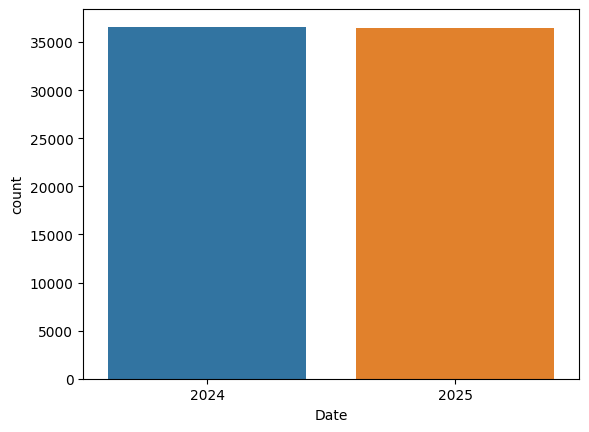

In [0]:
import seaborn as sns
sns.countplot(x=pd.to_datetime(raw_df.Date).dt.year)

In [0]:
from datetime import datetime

train_df = raw_df[raw_df['Date'] < datetime.strptime('2025-01-01', '%Y-%m-%d').date()]
val_df = raw_df[
    (raw_df['Date'] >= datetime.strptime('2025-01-01', '%Y-%m-%d').date()) &
    (raw_df['Date'] < datetime.strptime('2025-07-01', '%Y-%m-%d').date())
]
test_df = raw_df[raw_df['Date'] >= datetime.strptime('2025-07-01', '%Y-%m-%d').date()]

In [0]:
train_df

,Date,Location,Temperature,Humidity,Wind Speed,Precipitation,Cloud Cover,Pressure,Rain Tomorrow
0,2024-01-01,New York,87.524795,75.655455,28.379506,0.000000,69.617966,1026.030278,0
1,2024-01-02,New York,83.259325,28.712617,12.436433,0.526995,41.606048,995.962065,0
2,2024-01-03,New York,80.943050,64.740043,14.184831,0.916884,77.364763,980.796739,1
3,2024-01-04,New York,78.097552,59.738984,19.444029,0.094134,52.541196,979.012163,0
4,2024-01-05,New York,37.059963,34.766784,3.689661,1.361272,85.584000,1031.790859,0
...,...,...,...,...,...,...,...,...,...
72730,2024-12-27,Washington D.C.,88.233312,90.953072,19.167462,0.000000,62.694195,1000.655251,0
72731,2024-12-28,Washington D.C.,89.849733,80.397362,22.507210,0.190008,87.058197,1036.295224,0
72732,2024-12-29,Washington D.C.,68.434261,80.901718,14.391264,0.000000,43.897236,1017.065191,0
72733,2024-12-30,Washington D.C.,76.132156,77.142596,2.527844,0.211194,98.305318,1011.660909,0


In [0]:
raw_df

,Date,Location,Temperature,Humidity,Wind Speed,Precipitation,Cloud Cover,Pressure,Rain Tomorrow
0,2024-01-01,New York,87.524795,75.655455,28.379506,0.000000,69.617966,1026.030278,0
1,2024-01-02,New York,83.259325,28.712617,12.436433,0.526995,41.606048,995.962065,0
2,2024-01-03,New York,80.943050,64.740043,14.184831,0.916884,77.364763,980.796739,1
3,2024-01-04,New York,78.097552,59.738984,19.444029,0.094134,52.541196,979.012163,0
4,2024-01-05,New York,37.059963,34.766784,3.689661,1.361272,85.584000,1031.790859,0
...,...,...,...,...,...,...,...,...,...
73095,2025-12-27,Washington D.C.,40.614393,65.099438,28.778327,0.000000,54.168514,977.083747,0
73096,2025-12-28,Washington D.C.,52.641643,30.610525,12.282890,0.871000,22.068055,980.591675,0
73097,2025-12-29,Washington D.C.,56.492591,96.740232,2.894762,1.191956,52.336048,1016.469174,1
73098,2025-12-30,Washington D.C.,65.748956,63.900004,24.632400,0.483421,76.785280,1032.396146,1


In [0]:
val_df

,Date,Location,Temperature,Humidity,Wind Speed,Precipitation,Cloud Cover,Pressure,Rain Tomorrow
366,2025-01-01,New York,68.241693,39.173662,19.556068,0.000000,92.023554,1000.405444,0
367,2025-01-02,New York,82.527997,20.961679,14.648104,0.003940,46.493888,983.655373,0
368,2025-01-03,New York,30.965283,47.462228,21.658542,0.918893,40.539962,976.221000,0
369,2025-01-04,New York,49.066802,29.205850,26.671193,1.003235,14.546420,1003.670504,0
370,2025-01-05,New York,94.609916,44.150775,1.446052,0.614610,13.669649,992.773559,0
...,...,...,...,...,...,...,...,...,...
72911,2025-06-26,Washington D.C.,68.559651,85.144263,8.020993,0.000000,19.665520,1028.485104,0
72912,2025-06-27,Washington D.C.,37.553533,81.807071,12.853854,0.000000,58.857433,1038.750563,0
72913,2025-06-28,Washington D.C.,63.630520,58.591143,7.910388,0.472805,98.655504,1017.727296,0
72914,2025-06-29,Washington D.C.,61.138738,25.240551,6.081453,1.118716,51.998577,1039.331608,0


In [0]:
test_df

,Date,Location,Temperature,Humidity,Wind Speed,Precipitation,Cloud Cover,Pressure,Rain Tomorrow
547,2025-07-01,New York,61.666829,56.483123,24.523627,0.000000,54.369922,1015.597454,0
548,2025-07-02,New York,46.283890,28.377763,12.571592,0.630851,59.905089,992.430832,0
549,2025-07-03,New York,78.673863,88.267745,10.892225,0.522896,98.156299,1004.209304,1
550,2025-07-04,New York,83.274409,27.530505,17.874045,0.963371,28.073319,977.060962,0
551,2025-07-05,New York,45.836899,27.336426,14.626507,0.153700,38.685726,986.682314,0
...,...,...,...,...,...,...,...,...,...
73095,2025-12-27,Washington D.C.,40.614393,65.099438,28.778327,0.000000,54.168514,977.083747,0
73096,2025-12-28,Washington D.C.,52.641643,30.610525,12.282890,0.871000,22.068055,980.591675,0
73097,2025-12-29,Washington D.C.,56.492591,96.740232,2.894762,1.191956,52.336048,1016.469174,1
73098,2025-12-30,Washington D.C.,65.748956,63.900004,24.632400,0.483421,76.785280,1032.396146,1


In [0]:
input_cols = ['Location',	'Temperature',	'Humidity',	'Wind Speed',	'Precipitation',	'Cloud Cover',	'Pressure']	
target_col = 'Rain Tomorrow'

In [0]:
train_inputs= train_df[input_cols].copy()
train_target = train_df[target_col].copy()
val_inputs=val_df[input_cols].copy()
val_target=val_df[target_col].copy()
test_inputs=test_df[input_cols].copy()
test_target=test_df[target_col].copy()

In [0]:
train_inputs.select_dtypes(include='object').columns.tolist()

['Location']

In [0]:
import numpy as np
numeric_cols = train_inputs.select_dtypes(include=np.number).columns.tolist()
numeric_cols

['Temperature',
 'Humidity',
 'Wind Speed',
 'Precipitation',
 'Cloud Cover',
 'Pressure']

In [0]:
categorical_cols=['Location',]

In [0]:
train_df.isna().sum()

Date             0
Location         0
Temperature      0
Humidity         0
Wind Speed       0
Precipitation    0
Cloud Cover      0
Pressure         0
Rain Tomorrow    0
dtype: int64

In [0]:
from sklearn.preprocessing import MinMaxScaler

In [0]:
scaler = MinMaxScaler().fit(train_df[numeric_cols])

In [0]:
train_inputs[numeric_cols]=scaler.transform(train_inputs[numeric_cols])
val_inputs[numeric_cols]=scaler.transform(val_inputs[numeric_cols])
test_inputs[numeric_cols]=scaler.transform(test_inputs[numeric_cols])

In [0]:
train_inputs
val_inputs
test_inputs

,Location,Temperature,Humidity,Wind Speed,Precipitation,Cloud Cover,Pressure
547,New York,0.452394,0.456058,0.817529,0.000000,0.493000,0.651420
548,New York,0.232627,0.104724,0.419080,0.215587,0.554503,0.320448
549,New York,0.695363,0.853385,0.363094,0.178694,0.979526,0.488722
550,New York,0.761089,0.094133,0.595850,0.329222,0.200809,0.100864
551,New York,0.226241,0.091706,0.487585,0.052525,0.318728,0.238321
...,...,...,...,...,...,...,...
73095,Washington D.C.,0.151631,0.563767,0.959370,0.000000,0.490762,0.101190
73096,Washington D.C.,0.323457,0.132635,0.409455,0.297655,0.134083,0.151306
73097,Washington D.C.,0.378473,0.959297,0.096480,0.407338,0.470401,0.663874
73098,Washington D.C.,0.510713,0.548774,0.821155,0.165204,0.742065,0.891417


In [0]:
categorical_cols

['Location']

In [0]:
from sklearn.preprocessing import OneHotEncoder

In [0]:
train_inputs[categorical_cols]= train_inputs[categorical_cols].fillna('unknown')
val_inputs[categorical_cols]= val_inputs[categorical_cols].fillna('unknown')
test_inputs[categorical_cols]= test_inputs[categorical_cols].fillna('unknown')

In [0]:
encoder = OneHotEncoder(sparse=False, handle_unknown='ignore').fit(train_inputs[categorical_cols])

In [0]:
train_inputs

,Location,Temperature,Humidity,Wind Speed,Precipitation,Cloud Cover,Pressure
0,New York,0.821811,0.695724,0.946074,0.000000,0.662426,0.800470
1,New York,0.760873,0.108910,0.414574,0.180095,0.351176,0.370897
2,New York,0.727782,0.559275,0.472861,0.313335,0.748504,0.154236
3,New York,0.687130,0.496758,0.648189,0.032169,0.472680,0.128740
4,New York,0.100851,0.184590,0.122980,0.465200,0.839830,0.882769
...,...,...,...,...,...,...,...
72730,Washington D.C.,0.831934,0.886954,0.638969,0.000000,0.585494,0.437947
72731,Washington D.C.,0.855026,0.755001,0.750307,0.064933,0.856211,0.947121
72732,Washington D.C.,0.549076,0.761306,0.479743,0.000000,0.376634,0.672389
72733,Washington D.C.,0.659052,0.714314,0.084248,0.072173,0.981181,0.595180


In [0]:
train_targets=train_df["Rain Tomorrow"]
val_targets=val_df["Rain Tomorrow"]
test_targets=test_df["Rain Tomorrow"]

In [0]:
encoded_cols = list(encoder.get_feature_names_out(categorical_cols))

train_inputs[encoded_cols]=  encoder.transform(train_inputs[categorical_cols])
val_inputs[encoded_cols]= encoder.transform(val_inputs[categorical_cols])
test_inputs[encoded_cols]= encoder.transform(test_inputs[categorical_cols])

In [0]:
train_inputs

,Location,Temperature,Humidity,Wind Speed,Precipitation,Cloud Cover,Pressure,Location_Austin,Location_Charlotte,Location_Chicago,...,Location_Los Angeles,Location_New York,Location_Philadelphia,Location_Phoenix,Location_San Antonio,Location_San Diego,Location_San Francisco,Location_San Jose,Location_Seattle,Location_Washington D.C.
0,New York,0.821811,0.695724,0.946074,0.000000,0.662426,0.800470,0.0,0.0,0.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,New York,0.760873,0.108910,0.414574,0.180095,0.351176,0.370897,0.0,0.0,0.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,New York,0.727782,0.559275,0.472861,0.313335,0.748504,0.154236,0.0,0.0,0.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,New York,0.687130,0.496758,0.648189,0.032169,0.472680,0.128740,0.0,0.0,0.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,New York,0.100851,0.184590,0.122980,0.465200,0.839830,0.882769,0.0,0.0,0.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
72730,Washington D.C.,0.831934,0.886954,0.638969,0.000000,0.585494,0.437947,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
72731,Washington D.C.,0.855026,0.755001,0.750307,0.064933,0.856211,0.947121,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
72732,Washington D.C.,0.549076,0.761306,0.479743,0.000000,0.376634,0.672389,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
72733,Washington D.C.,0.659052,0.714314,0.084248,0.072173,0.981181,0.595180,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0


In [0]:
from sklearn.linear_model import LogisticRegression

In [0]:
model=LogisticRegression(solver='liblinear').fit(train_inputs[numeric_cols+encoded_cols],train_targets)

In [0]:
print(numeric_cols, encoded_cols)

['Temperature', 'Humidity', 'Wind Speed', 'Precipitation', 'Cloud Cover', 'Pressure'] ['Location_Austin', 'Location_Charlotte', 'Location_Chicago', 'Location_Columbus', 'Location_Dallas', 'Location_Denver', 'Location_Fort Worth', 'Location_Houston', 'Location_Indianapolis', 'Location_Jacksonville', 'Location_Los Angeles', 'Location_New York', 'Location_Philadelphia', 'Location_Phoenix', 'Location_San Antonio', 'Location_San Diego', 'Location_San Francisco', 'Location_San Jose', 'Location_Seattle', 'Location_Washington D.C.']


In [0]:
print(model.coef_.tolist())

[[-0.14366834502038472, 9.206115717173853, -0.22942910839257347, 13.347638742665001, -0.007441253001439233, -0.050101874835251255, -0.467516042764705, -0.5910677637752797, -0.33183207219988, -0.4405942871917498, -0.5364165386285801, -0.3698652613543872, -0.4926200306430372, -0.3566128066629888, -0.4573330045754744, -0.5145525413655788, -0.37602939974132715, -0.4491400629409647, -0.46069839623761977, -0.3688207254983299, -0.5063209241111603, -0.35157116339145456, -0.4124335883341699, -0.40440330311460787, -0.4268149775952605, -0.383260749604617]]


In [0]:
print(model.intercept_)

[-8.69790364]


In [0]:
weight_df=pd.DataFrame({
    'feature':numeric_cols+encoded_cols,
    'weight': model.coef_.tolist()[0]
})

In [0]:
weight_df

,feature,weight
0,Temperature,-0.143668
1,Humidity,9.206116
2,Wind Speed,-0.229429
3,Precipitation,13.347639
4,Cloud Cover,-0.007441
5,Pressure,-0.050102
6,Location_Austin,-0.467516
7,Location_Charlotte,-0.591068
8,Location_Chicago,-0.331832
9,Location_Columbus,-0.440594


<AxesSubplot:xlabel='weight', ylabel='feature'>

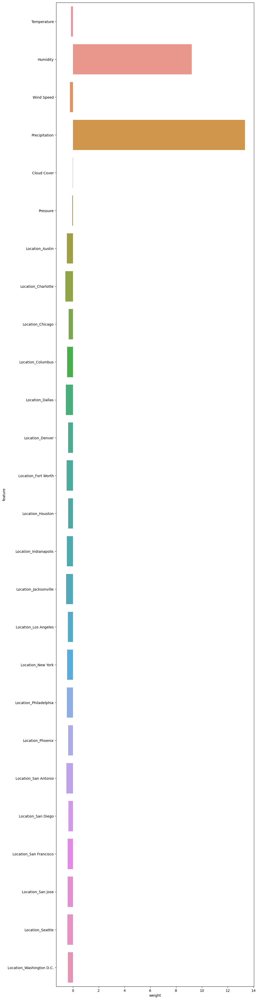

In [0]:
import matplotlib.pyplot as plt
plt.figure(figsize=(10,50))
sns.barplot(data=weight_df,x='weight',y='feature')

<AxesSubplot:xlabel='weight', ylabel='feature'>

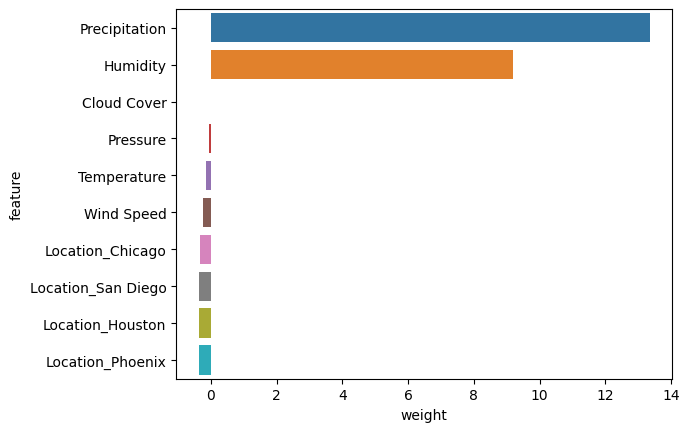

In [0]:
sns.barplot(data=weight_df.sort_values('weight',ascending=False).head(10),x='weight',y='feature')

In [0]:
x_train=train_inputs[numeric_cols+encoded_cols]
x_val=val_inputs[numeric_cols+encoded_cols]
x_test=test_inputs[numeric_cols+encoded_cols]

In [0]:
train_preds=model.predict(x_train)
val_preds=model.predict(x_val)
test_preds=model.predict(x_test)

In [0]:
train_preds

array([0, 0, 0, ..., 0, 0, 0], dtype=int32)

In [0]:
train_probs=model.predict_proba(x_train)
train_probs

array([[0.95780275, 0.04219725],
       [0.99744257, 0.00255743],
       [0.51058725, 0.48941275],
       ...,
       [0.90870625, 0.09129375],
       [0.84460479, 0.15539521],
       [0.69921616, 0.30078384]])

In [0]:
model.classes_



array([0, 1], dtype=int32)

In [0]:
from sklearn.metrics import accuracy_score


In [0]:
accuracy_score(train_targets, train_preds)
               

0.9050819672131147

In [0]:
accuracy_score(val_targets, val_preds)

0.9037016574585636

In [0]:
accuracy_score(test_targets, test_preds)

0.9035869565217391

In [0]:
from sklearn.metrics import confusion_matrix

In [0]:
from sklearn.metrics import confusion_matrix

In [0]:
confusion_matrix(train_targets, train_preds, normalize='true')

array([[0.96274009, 0.03725991],
       [0.30048647, 0.69951353]])

In [0]:
def predict_and_plot(inputs, targets, name=''):
    preds=model.predict(inputs)
    accuracy = accuracy_score(targets, preds)
    print('Accuracy:{:.2f}%'.format(accuracy*100))
    cf=confusion_matrix(targets, preds, normalize='true')
    plt.figure()
    sns.heatmap(cf,annot=True)
    plt.xlabel('prediction')
    plt.ylabel('Target')
    plt.title('{} confusion matrix'.format(name))
    return preds

Accuracy:90.51%


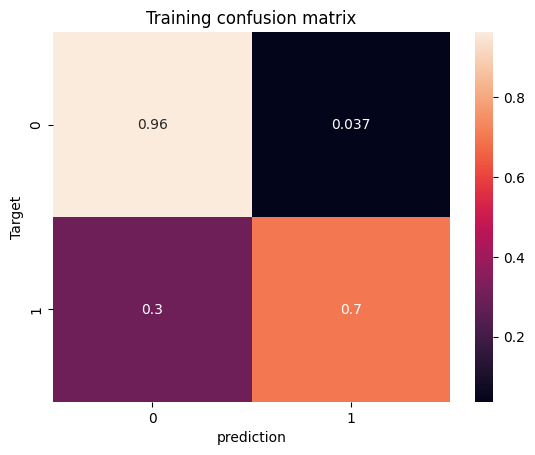

In [0]:
train_preds= predict_and_plot(x_train, train_targets, 'Training')

In [0]:
def random_guess(inputs):
    return np.random.choice([0,1],len(inputs))
def all_no(inputs):
    return np.full(len(inputs),0)

In [0]:
random_guess(x_val)

array([0, 1, 0, ..., 1, 0, 0])

In [0]:
accuracy_score(test_targets, random_guess(x_test))

0.49380434782608695

In [0]:
accuracy_score(train_targets, random_guess(x_train))

0.4999726775956284

In [0]:
accuracy_score(val_targets, random_guess(x_val))

0.5000552486187845

In [0]:
all_no(x_val)

array([0, 0, 0, ..., 0, 0, 0])

In [0]:
accuracy_score(test_targets, all_no(x_test))

0.7789673913043478

In [0]:
accuracy_score(val_targets, all_no(x_val))

0.7774585635359116

In [0]:
accuracy_score(train_targets, all_no(x_train))

0.7809562841530054

In [0]:
model=LogisticRegression(solver='saga',max_iter=1000).fit(train_inputs[numeric_cols+encoded_cols],train_targets)

In [0]:
train_preds=model.predict(x_train)
accuracy_score(train_targets, train_preds)

0.9052732240437158

In [0]:
val_preds=model.predict(x_val)
accuracy_score(val_targets, val_preds)

0.903646408839779

In [0]:
test_preds=model.predict(x_test)
accuracy_score(test_targets, test_preds)

0.9034782608695652

In [0]:
model=LogisticRegression(solver='liblinear',C=1000).fit(train_inputs[numeric_cols+encoded_cols],train_targets) 

In [0]:
train_preds=model.predict(x_train)
accuracy_score(train_targets, train_preds)

0.9055191256830601

In [0]:
val_preds=model.predict(x_val)
accuracy_score(val_targets, val_preds)

0.9033149171270718

In [0]:
test_preds=model.predict(x_test)
accuracy_score(test_targets,test_preds)

0.9030434782608696

In [0]:
model=LogisticRegression(solver='liblinear',class_weight='balanced',max_iter=1000).fit(train_inputs[numeric_cols+encoded_cols],train_targets) 

In [0]:
train_preds=model.predict(x_train)
accuracy_score(train_targets, train_preds)

0.8589344262295082

In [0]:
val_preds=model.predict(x_val)
accuracy_score(val_targets, val_preds)

0.8581215469613259

In [0]:
test_preds=model.predict(x_test)
accuracy_score(test_targets,test_preds)

0.861195652173913

In [0]:
from sklearn.tree import DecisionTreeClassifier

In [0]:
model = DecisionTreeClassifier(random_state=42)

In [0]:
model.fit(x_train, train_targets)

DecisionTreeClassifier(random_state=42)

In [0]:
train_preds= model.predict(x_train)
train_preds

array([0, 0, 1, ..., 0, 0, 0], dtype=int32)

In [0]:
accuracy_score(train_preds, train_targets)

1.0

In [0]:
model.fit(x_val, val_targets)

DecisionTreeClassifier(random_state=42)

In [0]:
val_preds=model.predict(x_val)
val_preds

array([0, 0, 0, ..., 0, 0, 0], dtype=int32)

In [0]:
accuracy_score(val_preds, val_targets)

1.0

In [0]:
test_preds=model.predict(x_test)
test_preds

array([0, 0, 1, ..., 1, 1, 0], dtype=int32)

In [0]:
accuracy_score(test_preds, test_targets)

0.9997282608695652